# Analyzing How Social Media / Phone Usage Can Affect Mental Health and Diet

I got this dataset from Kaggle when diving more into the topic I wanted to touch and found the topic an interesting way to highlight how the habit on using our phones during the time of screens can affect our day-to-day life. 

In [31]:
import pandas as pd
import plotly.express as px 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots

In [4]:
data = pd.read_csv('digital_diet_mental_health.csv')

In [5]:
df = pd.DataFrame(data)
df[:5]

,user_id,age,gender,daily_screen_time_hours,phone_usage_hours,laptop_usage_hours,tablet_usage_hours,tv_usage_hours,social_media_hours,work_related_hours,...,stress_level,physical_activity_hours_per_week,location_type,mental_health_score,uses_wellness_apps,eats_healthy,caffeine_intake_mg_per_day,weekly_anxiety_score,weekly_depression_score,mindfulness_minutes_per_day
0,user_1,51,Female,4.8,3.4,1.3,1.6,1.6,4.1,2.0,...,10,0.7,Urban,32,1,1,125.2,13,15,4.0
1,user_2,64,Male,3.9,3.5,1.8,0.9,2.0,2.7,3.1,...,6,4.3,Suburban,75,0,1,150.4,19,18,6.5
2,user_3,41,Other,10.5,2.1,2.6,0.7,2.2,3.0,2.8,...,5,3.1,Suburban,22,0,0,187.9,7,3,6.9
3,user_4,27,Other,8.8,0.0,0.0,0.7,2.5,3.3,1.6,...,5,0.0,Rural,22,0,1,73.6,7,2,4.8
4,user_5,55,Male,5.9,1.7,1.1,1.5,1.6,1.1,3.6,...,7,3.0,Urban,64,1,1,217.5,8,10,0.0


In [6]:
df.columns

Index(['user_id', 'age', 'gender', 'daily_screen_time_hours',
       'phone_usage_hours', 'laptop_usage_hours', 'tablet_usage_hours',
       'tv_usage_hours', 'social_media_hours', 'work_related_hours',
       'entertainment_hours', 'gaming_hours', 'sleep_duration_hours',
       'sleep_quality', 'mood_rating', 'stress_level',
       'physical_activity_hours_per_week', 'location_type',
       'mental_health_score', 'uses_wellness_apps', 'eats_healthy',
       'caffeine_intake_mg_per_day', 'weekly_anxiety_score',
       'weekly_depression_score', 'mindfulness_minutes_per_day'],
      dtype='object')

In [11]:
df.dtypes

user_id                              object
age                                   int64
gender                               object
daily_screen_time_hours             float64
phone_usage_hours                   float64
laptop_usage_hours                  float64
tablet_usage_hours                  float64
tv_usage_hours                      float64
social_media_hours                  float64
work_related_hours                  float64
entertainment_hours                 float64
gaming_hours                        float64
sleep_duration_hours                float64
sleep_quality                         int64
mood_rating                           int64
stress_level                          int64
physical_activity_hours_per_week    float64
location_type                        object
mental_health_score                   int64
uses_wellness_apps                    int64
eats_healthy                          int64
caffeine_intake_mg_per_day          float64
weekly_anxiety_score            

In [13]:
df[df['age'] <= 25].count()

user_id                             483
age                                 483
gender                              483
daily_screen_time_hours             483
phone_usage_hours                   483
laptop_usage_hours                  483
tablet_usage_hours                  483
tv_usage_hours                      483
social_media_hours                  483
work_related_hours                  483
entertainment_hours                 483
gaming_hours                        483
sleep_duration_hours                483
sleep_quality                       483
mood_rating                         483
stress_level                        483
physical_activity_hours_per_week    483
location_type                       483
mental_health_score                 483
uses_wellness_apps                  483
eats_healthy                        483
caffeine_intake_mg_per_day          483
weekly_anxiety_score                483
weekly_depression_score             483
mindfulness_minutes_per_day         483


In [15]:
print(f'the youngest subject is: {df['age'].min()}\nthe oldest subject is: {df['age'].max()}')

the youngest subject is: 13
the oldest subject is: 64


In [17]:
df[(df['gender'] == 'Other') & (df['age'] <= 25)].count()

user_id                             41
age                                 41
gender                              41
daily_screen_time_hours             41
phone_usage_hours                   41
laptop_usage_hours                  41
tablet_usage_hours                  41
tv_usage_hours                      41
social_media_hours                  41
work_related_hours                  41
entertainment_hours                 41
gaming_hours                        41
sleep_duration_hours                41
sleep_quality                       41
mood_rating                         41
stress_level                        41
physical_activity_hours_per_week    41
location_type                       41
mental_health_score                 41
uses_wellness_apps                  41
eats_healthy                        41
caffeine_intake_mg_per_day          41
weekly_anxiety_score                41
weekly_depression_score             41
mindfulness_minutes_per_day         41
dtype: int64

In [95]:
df_yp = df[(df['age'] <= 25) & (df['gender'] != 'Other')]
df_yp = df_yp.copy()
df_yp[:5]

,user_id,age,gender,daily_screen_time_hours,phone_usage_hours,laptop_usage_hours,tablet_usage_hours,tv_usage_hours,social_media_hours,work_related_hours,...,stress_level,physical_activity_hours_per_week,location_type,mental_health_score,uses_wellness_apps,eats_healthy,caffeine_intake_mg_per_day,weekly_anxiety_score,weekly_depression_score,mindfulness_minutes_per_day
5,user_6,20,Female,9.9,3.2,2.7,1.2,3.3,1.6,2.5,...,2,3.3,Suburban,72,1,0,102.8,17,16,11.5
10,user_11,23,Female,6.6,2.4,1.0,1.3,0.6,2.3,1.8,...,10,3.3,Suburban,27,0,1,110.3,19,3,10.5
11,user_12,23,Male,5.2,3.9,1.8,0.7,2.5,2.5,2.4,...,10,4.2,Suburban,73,0,1,220.9,3,15,16.4
16,user_17,15,Male,4.2,2.4,3.1,0.0,2.1,1.1,0.9,...,9,6.7,Urban,21,1,1,92.9,20,5,0.0
18,user_19,14,Male,5.5,2.7,0.8,1.2,0.1,3.0,1.2,...,9,2.3,Suburban,46,0,1,184.8,10,3,11.5


In [97]:
df_op = df[(df['age'] > 25) & (df['gender'] != 'Other')]
df_op = df_op.copy()
df_op[:5]

,user_id,age,gender,daily_screen_time_hours,phone_usage_hours,laptop_usage_hours,tablet_usage_hours,tv_usage_hours,social_media_hours,work_related_hours,...,stress_level,physical_activity_hours_per_week,location_type,mental_health_score,uses_wellness_apps,eats_healthy,caffeine_intake_mg_per_day,weekly_anxiety_score,weekly_depression_score,mindfulness_minutes_per_day
0,user_1,51,Female,4.8,3.4,1.3,1.6,1.6,4.1,2.0,...,10,0.7,Urban,32,1,1,125.2,13,15,4.0
1,user_2,64,Male,3.9,3.5,1.8,0.9,2.0,2.7,3.1,...,6,4.3,Suburban,75,0,1,150.4,19,18,6.5
4,user_5,55,Male,5.9,1.7,1.1,1.5,1.6,1.1,3.6,...,7,3.0,Urban,64,1,1,217.5,8,10,0.0
6,user_7,33,Male,5.8,4.0,3.2,1.9,1.3,0.9,1.7,...,9,6.8,Urban,45,0,0,162.8,6,4,7.9
7,user_8,51,Female,7.4,2.9,3.0,0.9,3.4,1.2,2.2,...,2,3.5,Urban,23,0,1,147.1,9,8,4.4


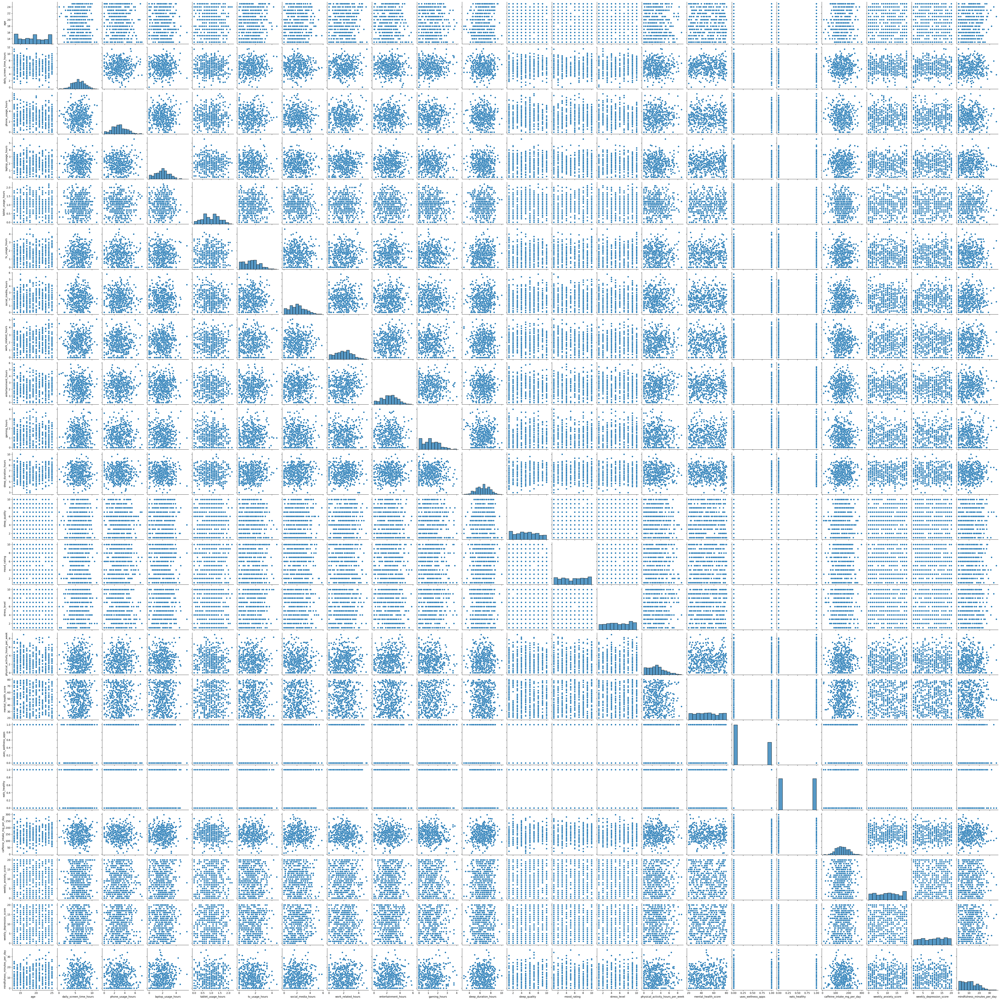

In [23]:
sns.pairplot(df_yp, diag_kind= 'hist')

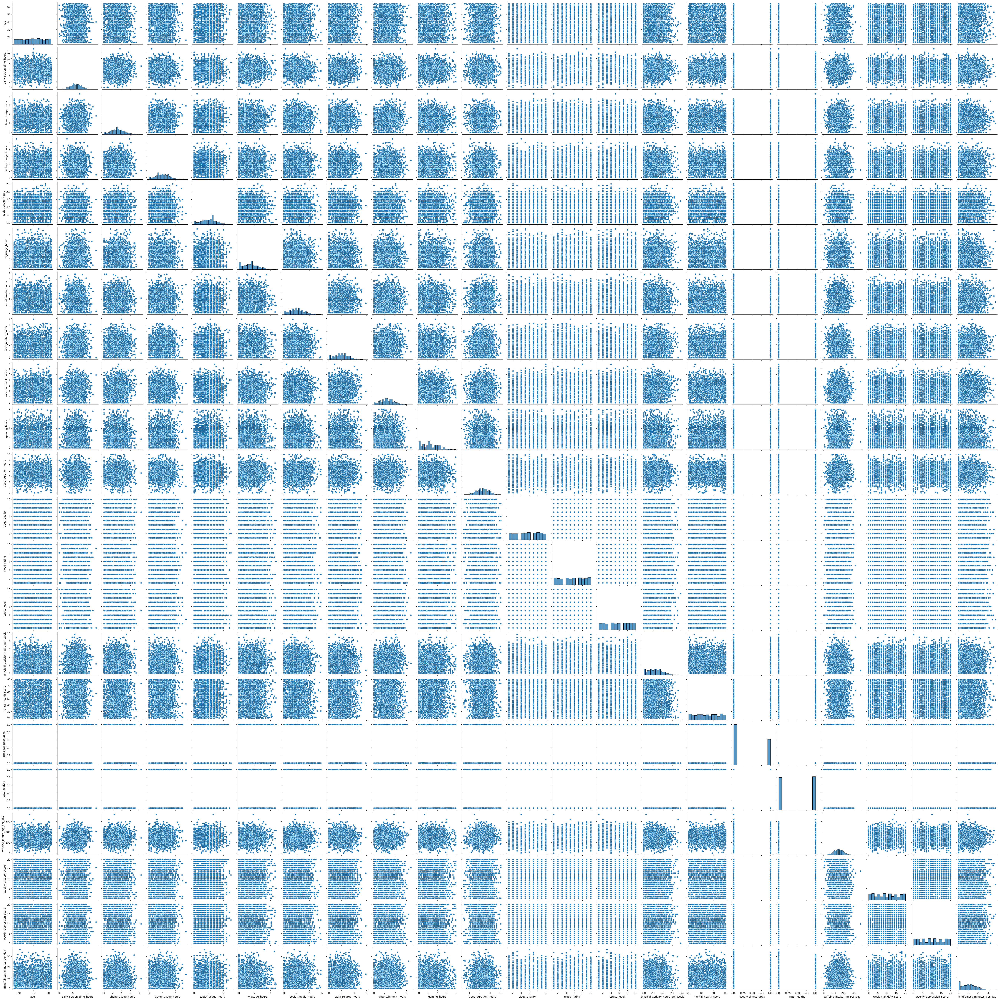

In [24]:
sns.pairplot(df)

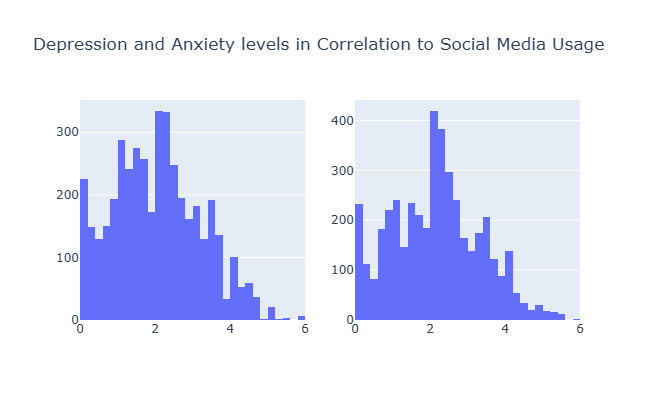

In [99]:
fig = make_subplots(rows=1, cols=2)

fig1 = px.histogram(df_yp, x="social_media_hours", y="weekly_anxiety_score", 
                title='Social Media Usage in relation to Weekly Anxiety')

fig2 = px.histogram(df_yp, x="social_media_hours", y="weekly_depression_score", 
                title='Social Media Usage in relation to Weekly Anxiety')

fig.add_trace(fig1.data[0], row=1, col=1)
fig.add_trace(fig2.data[0], row=1, col=2)

fig.update_layout(width=900, height=400, title_text='Depression and Anxiety levels in Correlation to Social Media Usage')
fig.show()

In [101]:
diff = df_yp['caffeine_intake_mg_per_day'].max() - df_yp['caffeine_intake_mg_per_day'].min()
df_yp['caffeine_intake_mg_per_day'] = (df_yp['caffeine_intake_mg_per_day'] - df_yp['caffeine_intake_mg_per_day'].min()) / diff

In [103]:
df_yp = df_yp.drop(columns=['user_id', 'laptop_usage_hours', 'tablet_usage_hours',
       'tv_usage_hours', 'work_related_hours',
       'entertainment_hours', 'gaming_hours',
       'physical_activity_hours_per_week', 'uses_wellness_apps',
        'eats_healthy', 'mindfulness_minutes_per_day'])

In [105]:
df_yp[:5]

,age,gender,daily_screen_time_hours,phone_usage_hours,social_media_hours,sleep_duration_hours,sleep_quality,mood_rating,stress_level,location_type,mental_health_score,caffeine_intake_mg_per_day,weekly_anxiety_score,weekly_depression_score
5,20,Female,9.9,3.2,1.6,6.0,3,10,2,Suburban,72,0.325694,17,16
10,23,Female,6.6,2.4,2.3,6.0,8,9,10,Suburban,27,0.351736,19,3
11,23,Male,5.2,3.9,2.5,8.7,2,4,10,Suburban,73,0.735764,3,15
16,15,Male,4.2,2.4,1.1,5.3,8,2,9,Urban,21,0.291319,20,5
18,14,Male,5.5,2.7,3.0,7.3,8,8,9,Suburban,46,0.610417,10,3


In [107]:
df_yp.columns

Index(['age', 'gender', 'daily_screen_time_hours', 'phone_usage_hours',
       'social_media_hours', 'sleep_duration_hours', 'sleep_quality',
       'mood_rating', 'stress_level', 'location_type', 'mental_health_score',
       'caffeine_intake_mg_per_day', 'weekly_anxiety_score',
       'weekly_depression_score'],
      dtype='object')

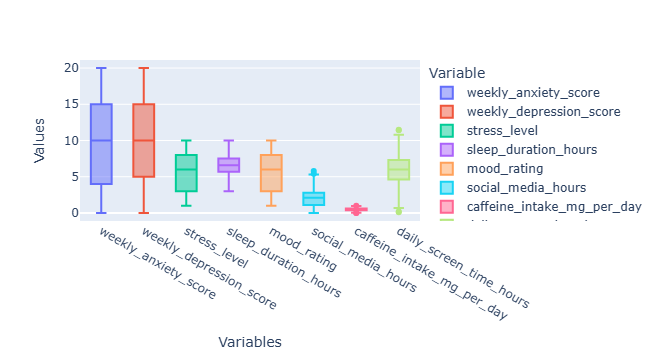

In [113]:
cols = ['weekly_anxiety_score','weekly_depression_score','stress_level',
        'sleep_duration_hours','mood_rating','social_media_hours','daily_screen_time_hours']

df_long = df_yp.melt(value_vars=cols, var_name='Variable', value_name='Value')

fig = px.box(df_long, x='Variable', y='Value', color='Variable',)

fig.update_layout(xaxis_title='Variables', yaxis_title='Values')
fig.show()

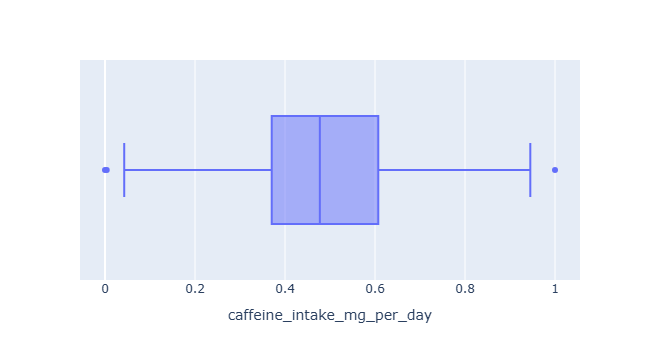

In [119]:
fig = px.box(df_yp, x='caffeine_intake_mg_per_day')
fig.show()

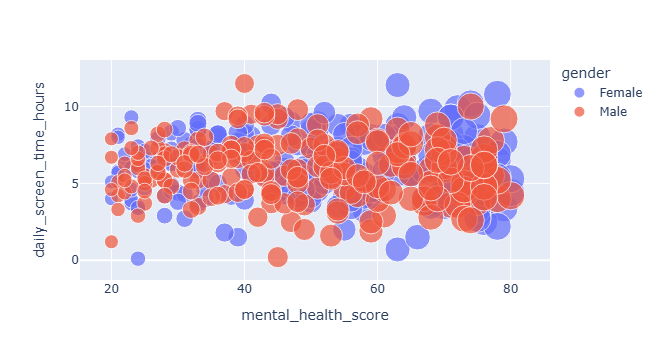

In [137]:
fig = px.scatter(df_yp, x='mental_health_score', y='daily_screen_time_hours', size='mental_health_score', color='gender')
fig.show()

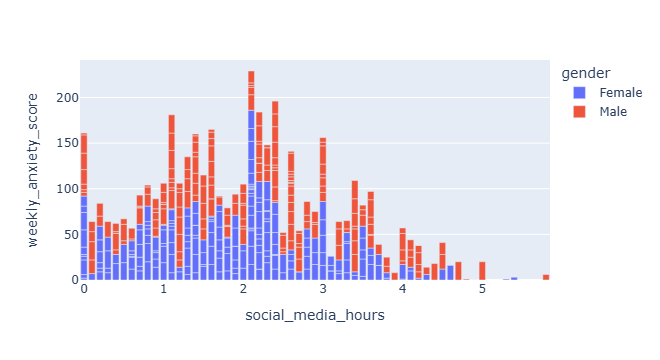

In [143]:
fig=px.bar(df_yp, x='social_media_hours', y='weekly_anxiety_score', color='gender')
fig.show()